In [1]:
import velvetvae as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [104]:
import torchsde
from sdtw import SoftDTW

def get_plot_data(
    gene_expression,
    gene,
    mean_normalize=True
):
    gene_index = np.where(model.adata.var_names==gene)[0][0]
    gene_data = gene_expression[:,:,gene_index].cpu().numpy()
    
    mu = gene_data.mean(0)
    if mean_normalize:    
        mumax = mu.max()
        gene_data = gene_data / mumax
        mu = mu / mumax
    return gene_data, mu

In [4]:
neural = sc.read_h5ad('../data/neural_data_0606.h5ad')

state_path = '../models/neural_vf_0606_model.pt'

vt.md.Velvet.setup_anndata(neural, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

trained_state = torch.load(state_path)['model_state_dict']

model.module.load_state_dict(trained_state)

INFO     Generating sequential column names                                                                        


<All keys matched successfully>

In [6]:
model.module.to('cuda')
markov = vt.sb.MarkovProcess(
    model,
    n_neighbors=10,
    use_space='latent_space',
    use_spline=True, 
    use_similarity=False
)

KNN indices for Velvet stored in .obsm['knn_index'].


# Let's test markov walks.

- Trajectories in space
- randomness of fate
- gex

In [8]:
model.adata.obs['cell_type'] = ['Progenitor' if a in ['p3','pMN','Neural','Early_Neural'] else 'Neuron' 
                                for a in model.adata.obs.cell_annotation]

initial_cells = model.adata[[tp in ['D4'] for tp in model.adata.obs.timepoint]]
initial_cells = initial_cells[initial_cells.obs.cell_type=='Progenitor']

In [9]:
z = torch.tensor(model.adata.obsm['X_z'], device=model.device)
init_indices = torch.arange(z.shape[0], device=model.device)[[c in initial_cells.obs_names for c in model.adata.obs_names]]

walks = markov.random_walk(
    z,
    initial_states=init_indices,
    n_jumps=50,
    n_steps=100,
)

In [14]:
n_clusters = 3
avg_center, labels, centers, index = vt.cl.cluster_trajectories(
    walks, 
    n_clusters=n_clusters, 
    final_steps=20,
    n_iterations=500
)

cluster_labels = labels.cpu().numpy()

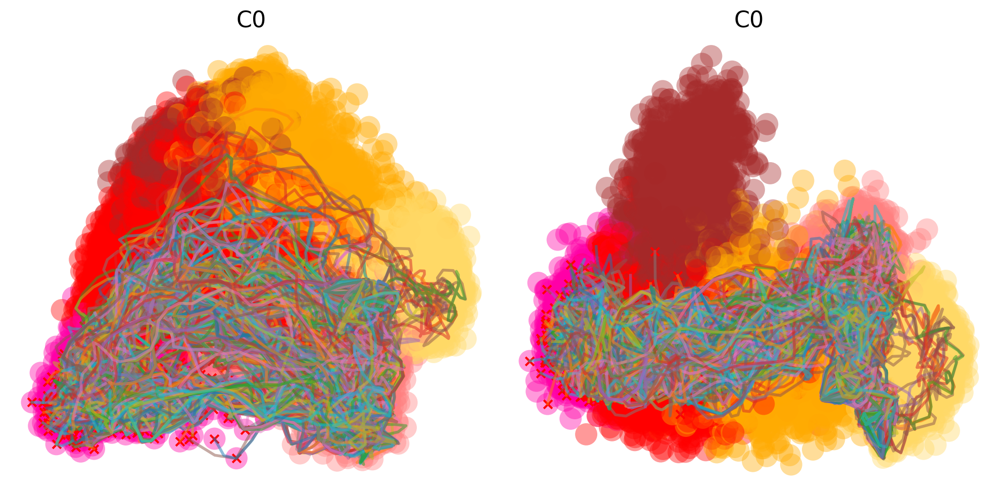

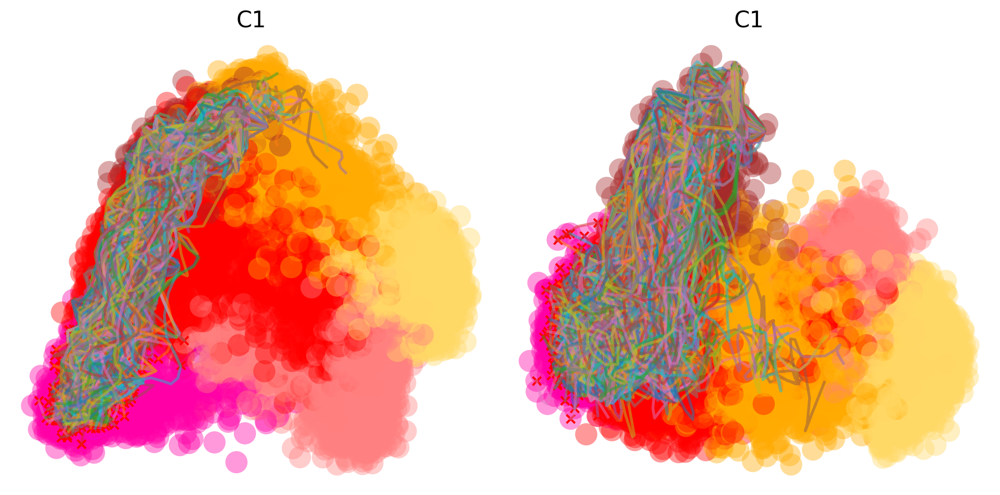

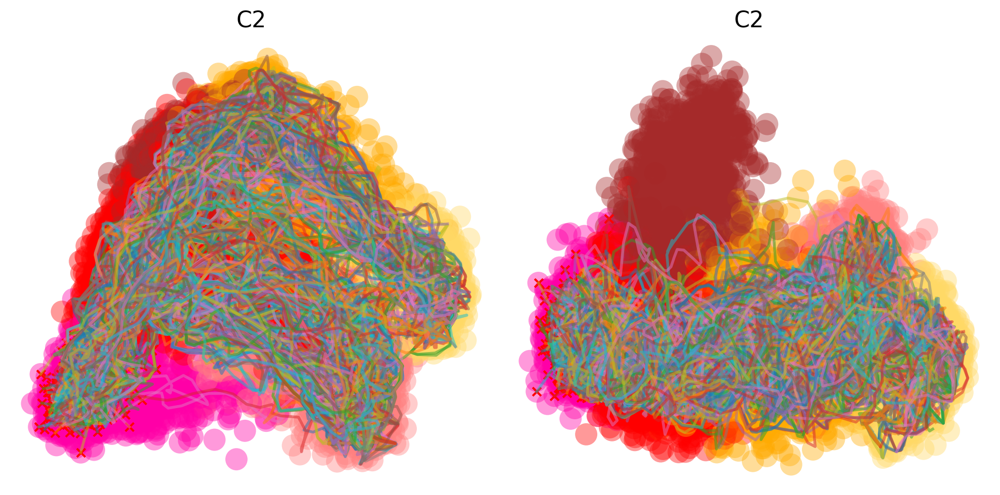

In [15]:
for i in range(n_clusters):
    fig = plt.figure(figsize=(10,5), dpi=200)
    ax1, ax2 = fig.subplots(1,2)
    
    vt.pl.trajectories_2d(model, walks[cluster_labels==i], ax=ax1, cell_palette=colpal.celltype,
                          line_alpha=0.5, components=[0,1], show=False,
                          cell_color='cell_annotation', title=f"C{i}")
    
    vt.pl.trajectories_2d(model, walks[cluster_labels==i], ax=ax2, cell_palette=colpal.celltype,
                          line_alpha=0.5, components=[0,4], show=False,
                          cell_color='cell_annotation', title=f"C{i}")
    
    plt.show()

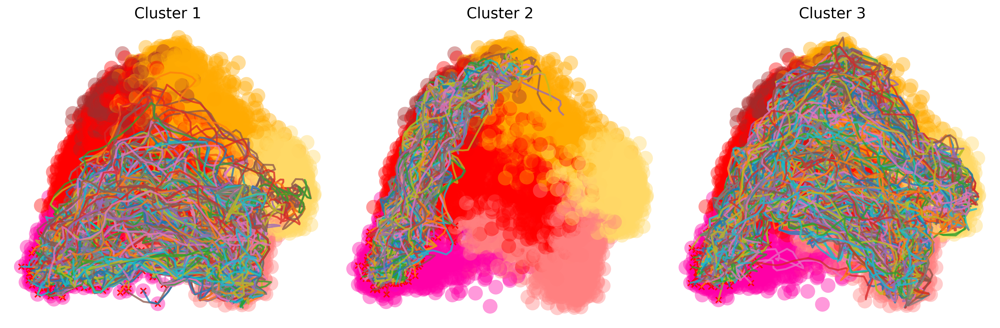

In [157]:
fig = plt.figure(figsize=(15,5), dpi=300)
ax1, ax2, ax3 = fig.subplots(1,3)

vt.pl.trajectories_2d(model, walks[cluster_labels==0], ax=ax1, cell_palette=colpal.celltype,
                      line_alpha=0.75, components=[0,1], show=False,
                      cell_color='cell_annotation', title=f"Cluster 1")

vt.pl.trajectories_2d(model, walks[cluster_labels==1], ax=ax2, cell_palette=colpal.celltype,
                      line_alpha=0.75, components=[0,1], show=False,
                      cell_color='cell_annotation', title=f"Cluster 2")

vt.pl.trajectories_2d(model, walks[cluster_labels==2], ax=ax3, cell_palette=colpal.celltype,
                      line_alpha=0.75, components=[0,1], show=False,
                      cell_color='cell_annotation', title=f"Cluster 3")

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig("../figures/2.11.0_markov_trajs.png", bbox_inches='tight')     
plt.show()

In [22]:
mn_traj = walks[cluster_labels==0]
mn_gex = model.get_trajectory_gene_expression(mn_traj)

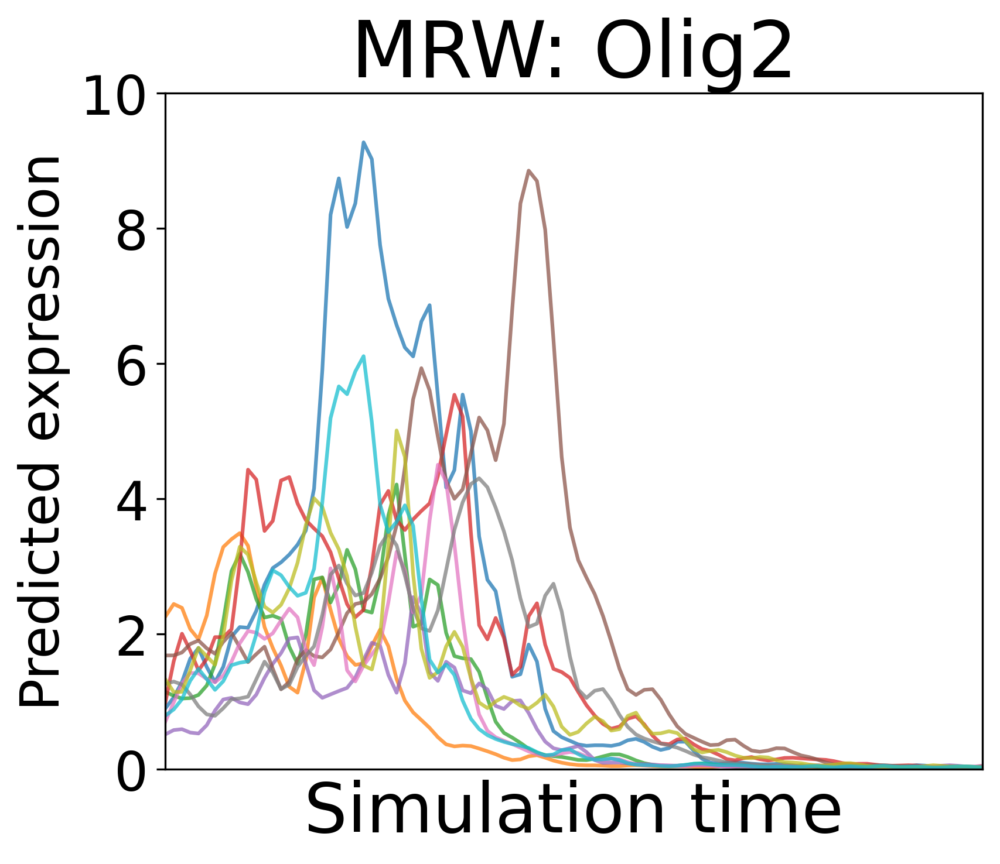

In [158]:
genes = ['Olig2']
genedict = {}
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0.2,0.9,len(genes))]
for gene in genes:
    results = get_plot_data(mn_gex, gene, mean_normalize=False)
    genedict[gene] = results
    
alphas = [0.2,0.22,.27,0.3]

plt.figure(figsize=(6,5), dpi=300)
for gene, col, alf in zip(genes, colors, alphas):
    ts = genedict[gene][0]
    mu = genedict[gene][1]
    for t in ts[np.random.choice(ts.shape[0], size=10)]:
        plt.plot(t, alpha=0.75)

plt.title("MRW: Olig2", fontsize=32)
plt.ylabel("Predicted expression", fontsize=22)
plt.xticks([])
plt.xlabel("Simulation time", fontsize=28)
plt.xlim((0,99))
plt.ylim((0,10))
plt.yticks(fontsize=22)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
plt.savefig("../figures/2.11.1_markov_olig2.png", bbox_inches='tight')     

plt.show()

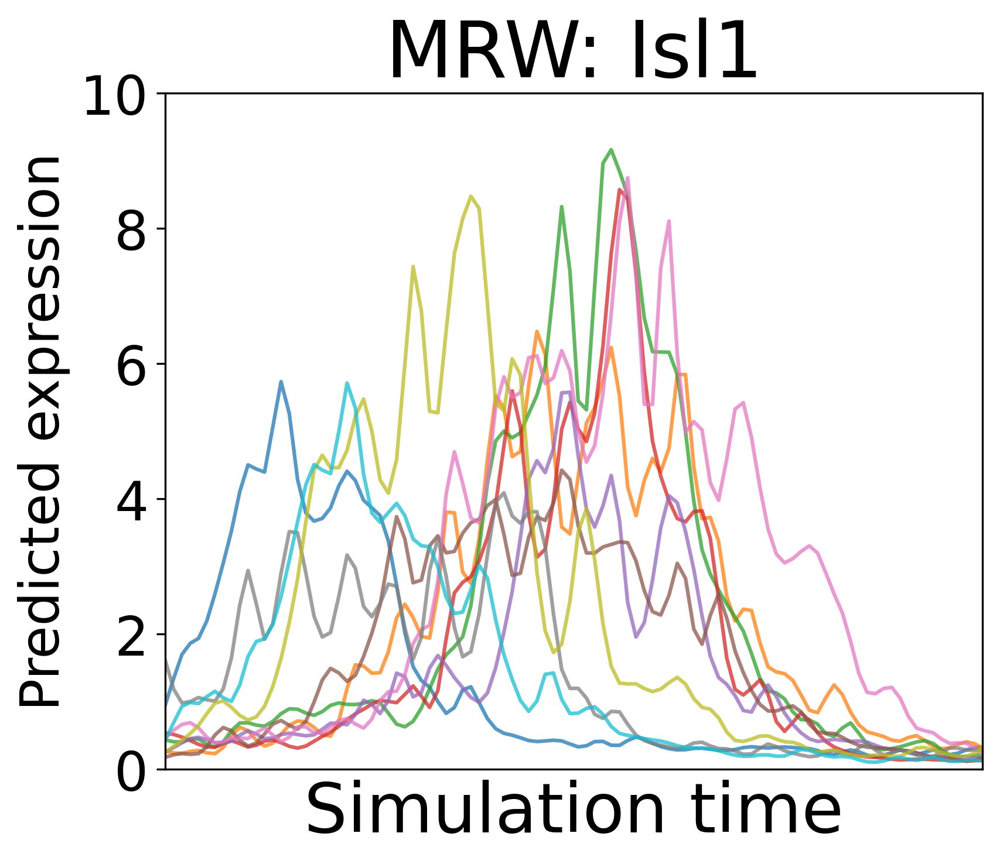

In [159]:
genes = ['Isl1']
genedict = {}
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0.2,0.9,len(genes))]
for gene in genes:
    results = get_plot_data(mn_gex, gene, mean_normalize=False)
    genedict[gene] = results
    
alphas = [0.2,0.22,.27,0.3]

plt.figure(figsize=(6,5), dpi=300)
for gene, col, alf in zip(genes, colors, alphas):
    ts = genedict[gene][0]
    mu = genedict[gene][1]
    for t in ts[np.random.choice(ts.shape[0], size=10)]:
        plt.plot(t, alpha=0.75)

plt.title("MRW: Isl1", fontsize=32)
plt.ylabel("Predicted expression", fontsize=22)
plt.xticks([])
plt.xlabel("Simulation time", fontsize=28)
plt.xlim((0,99))
plt.ylim((0,10))
plt.yticks(fontsize=22)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
plt.savefig("../figures/2.11.2_markov_isl1.png", bbox_inches='tight')     

plt.show()

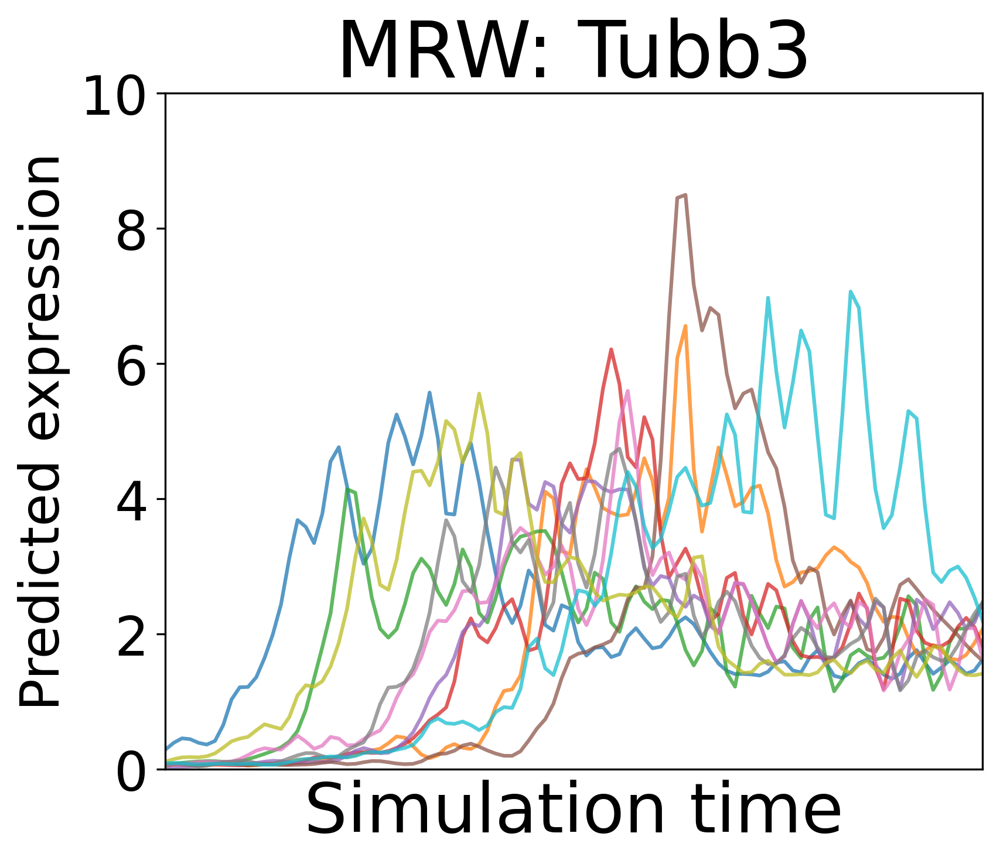

In [160]:
genes = ['Tubb3']
genedict = {}
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0.2,0.9,len(genes))]
for gene in genes:
    results = get_plot_data(mn_gex, gene, mean_normalize=False)
    genedict[gene] = results
    
alphas = [0.2,0.22,.27,0.3]

plt.figure(figsize=(6,5), dpi=300)
for gene, col, alf in zip(genes, colors, alphas):
    ts = genedict[gene][0]
    mu = genedict[gene][1]
    for t in ts[np.random.choice(ts.shape[0], size=10)]:
        plt.plot(t, alpha=0.75)

plt.title("MRW: Tubb3", fontsize=32)
plt.ylabel("Predicted expression", fontsize=22)
plt.xticks([])
plt.xlabel("Simulation time", fontsize=28)
plt.xlim((0,99))
plt.ylim((0,10))
plt.yticks(fontsize=22)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
plt.savefig("../figures/2.11.3_markov_tubb3.png", bbox_inches='tight')     

plt.show()

In [97]:
import pickle 

with open('../data/F4_noisy0.1_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
    
mn_mu = data["MN"].mean(0, keepdim=True)
v3_mu = data["V3"].mean(0, keepdim=True)
fp_mu = data["FP"].mean(0, keepdim=True)    

In [115]:
sdtw = SoftDTW(use_cuda=True)


In [136]:
f1 = []
f3 = []
f2 = []
for rep in range(1,11):
    res = []
    for i in tqdm(init_indices):
        wa = markov.random_walk(
            z,
            initial_states=init_indices[0].repeat(rep),
            n_jumps=50,
            n_steps=100,
        )
        n_fates = torch.vstack((
            sdtw(wa, mn_mu.repeat(wa.shape[0],1,1)),
            sdtw(wa, v3_mu.repeat(wa.shape[0],1,1)),
            sdtw(wa, fp_mu.repeat(wa.shape[0],1,1)),
        )).argmin(0).unique().shape[0]

        res.append(n_fates)
    f1.append(np.mean(np.array(res)==1))
    f2.append(np.mean(np.array(res)==2))
    f3.append(np.mean(np.array(res)==3))



100%|██████████| 3329/3329 [00:59<00:00, 55.68it/s]


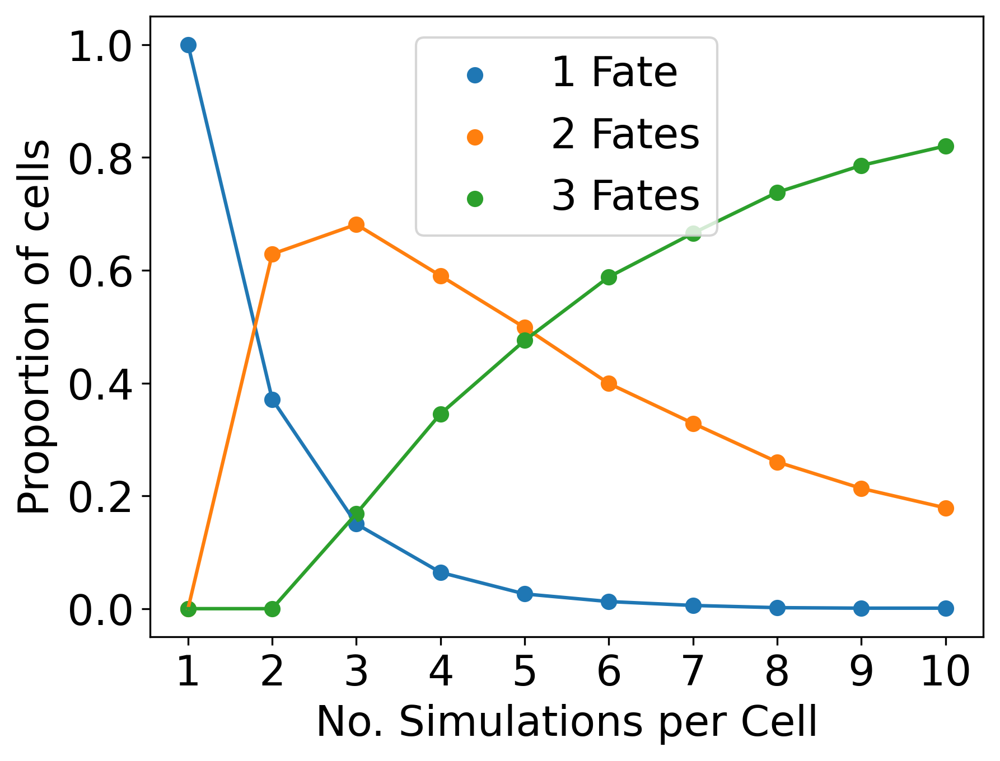

In [155]:
plt.figure(dpi=300)
plt.plot(f1)
plt.scatter(np.arange(len(f1)),f1, label='1 Fate')
plt.plot(f2)
plt.scatter(np.arange(len(f1)),f2, label='2 Fates')
plt.plot(f3)
plt.scatter(np.arange(len(f1)),f3, label='3 Fates')
plt.legend(fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(np.linspace(0,9,10),np.linspace(1,10,10, dtype=int), fontsize=18)
plt.ylabel("Proportion of cells", fontsize=18)
plt.xlabel("No. Simulations per Cell", fontsize=18)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig("../figures/2.11.5_markov_fates.png", bbox_inches='tight')       

plt.show()
        